In [1]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad

scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False)
cr.settings.verbosity = 2

In [3]:
pseudotime = sc.read_h5ad('/home/mhassan/endoCellAtlas/CellRank2clone/Palantir_from_InHouse_monocle3pseudotime_harmonyInt.h5ad')
pseudotime

AnnData object with n_obs × n_vars = 17353 × 47372
    obs: 'barcode', 'BC_Seq', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Mt', 'Rb', 'Mt_Rb', 'Condition', 'gender', 'BMI', 'Age', 'S.Score', 'G2M.Score', 'Phase', 'samples', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'annotation_heatmap', 'Venous.ECs_signature', 'Arterial.ECs_signature', 'Capillary.ECs_signature', 'Pericytes_signature', 'VSMCs_signature', 'Lymphatic.ECs_signature', 'Activated.ECs_signature', 'Vascular_labels', 'transferred_labels_from_Act', 'ident', 'Size_Factor', 'monocle3_clusters', 'monocle3_partitions', 'monocle3_pseudotime', 'CytoTRACE2_Score', 'CytoTRACE2_Relative', 'preKNN_CytoTRACE2_Score', 'preKNN_CytoTRACE2_Potency', 'cell_bc', 'n_counts', 'leiden', 'palantir_pseudotime', 'palantir_entropy'
    var: 'name', 'highly_variable', 'means', 'dispersion

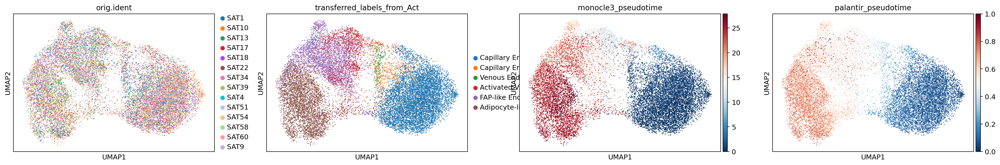

In [4]:
sc.pl.umap(pseudotime, color = ['orig.ident', 'transferred_labels_from_Act', 'monocle3_pseudotime', 'palantir_pseudotime'])

In [9]:
ldata = sc.read_h5ad("/home/mhassan/endoCellAtlas/CellRank2clone/InHouse_loom_files.h5ad")

In [13]:
# merge matrices into the original adata object
adata = scv.utils.merge(pseudotime, ldata)
adata

AnnData object with n_obs × n_vars = 16797 × 33871
    obs: 'barcode', 'BC_Seq', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Mt', 'Rb', 'Mt_Rb', 'Condition', 'gender', 'BMI', 'Age', 'S.Score', 'G2M.Score', 'Phase', 'samples', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'annotation_heatmap', 'Venous.ECs_signature', 'Arterial.ECs_signature', 'Capillary.ECs_signature', 'Pericytes_signature', 'VSMCs_signature', 'Lymphatic.ECs_signature', 'Activated.ECs_signature', 'Vascular_labels', 'transferred_labels_from_Act', 'ident', 'Size_Factor', 'monocle3_clusters', 'monocle3_partitions', 'monocle3_pseudotime', 'CytoTRACE2_Score', 'CytoTRACE2_Relative', 'preKNN_CytoTRACE2_Score', 'preKNN_CytoTRACE2_Potency', 'cell_bc', 'n_counts', 'leiden', 'palantir_pseudotime', 'palantir_entropy', 'Clusters', '_X', '_Y', 'batch', 'initial_size_unsplice

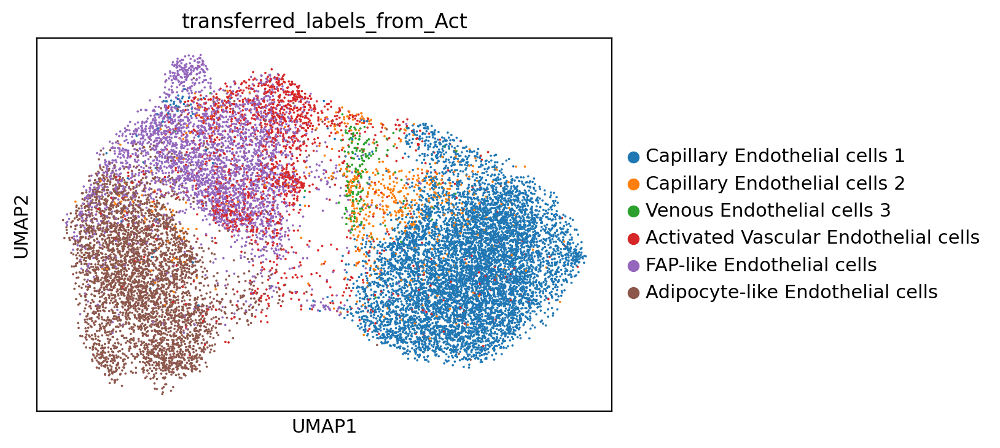

In [14]:
sc.pl.umap(adata, color = 'transferred_labels_from_Act')

In [15]:
import random
# Downsampling
adata = adata[random.sample(range(0, adata.n_obs), 15000), ] # Downsample
adata

View of AnnData object with n_obs × n_vars = 15000 × 33871
    obs: 'barcode', 'BC_Seq', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Mt', 'Rb', 'Mt_Rb', 'Condition', 'gender', 'BMI', 'Age', 'S.Score', 'G2M.Score', 'Phase', 'samples', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'annotation_heatmap', 'Venous.ECs_signature', 'Arterial.ECs_signature', 'Capillary.ECs_signature', 'Pericytes_signature', 'VSMCs_signature', 'Lymphatic.ECs_signature', 'Activated.ECs_signature', 'Vascular_labels', 'transferred_labels_from_Act', 'ident', 'Size_Factor', 'monocle3_clusters', 'monocle3_partitions', 'monocle3_pseudotime', 'CytoTRACE2_Score', 'CytoTRACE2_Relative', 'preKNN_CytoTRACE2_Score', 'preKNN_CytoTRACE2_Potency', 'cell_bc', 'n_counts', 'leiden', 'palantir_pseudotime', 'palantir_entropy', 'Clusters', '_X', '_Y', 'batch', 'initial_size_

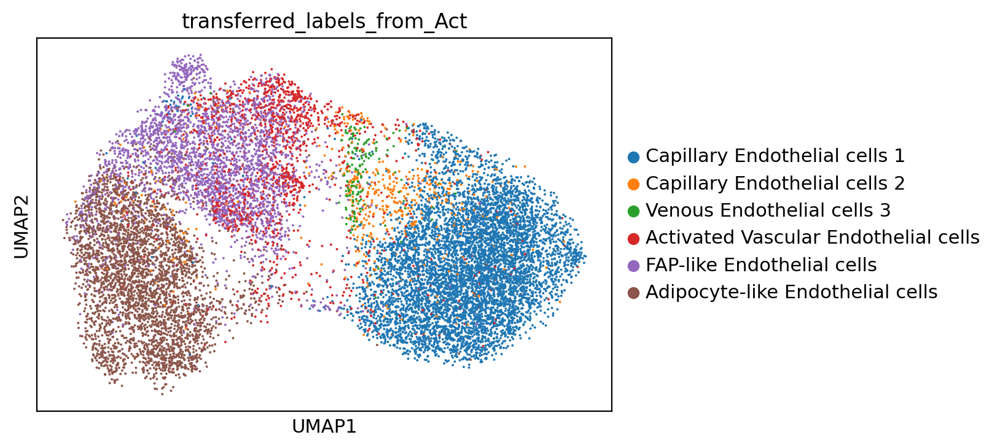

In [16]:
# plot umap to check
sc.pl.umap(adata, color='transferred_labels_from_Act')

# Part 2: Computing RNA velocity using scVelo

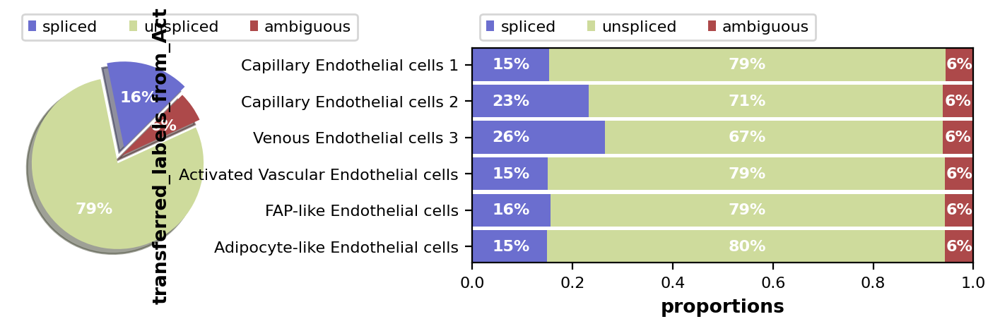

In [17]:
scv.pl.proportions(adata, groupby='transferred_labels_from_Act')

In [18]:
scv.pp.filter_and_normalize(
    adata, min_shared_counts=20, n_top_genes=2000, subset_highly_variable=True
)

sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30, random_state=0)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 22101 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [ ]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 72/192 cores)


  0%|          | 0/484 [00:00<?, ?gene/s]

/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=542631) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/joblib/externals/loky/backend/fork_exec.py:38: DeprecationWarning: This process (pid=542631) is multi-threaded, use of fork() may lead to deadlocks in the child.
  pid = os.fork()
IOStream.flush timed out
IOStream.flush timed out


In [ ]:
scv.tl.velocity(adata, mode="dynamical")

In [ ]:
scv.tl.velocity_graph(adata)

In [ ]:
scv.pl.velocity_embedding(adata, basis='umap')

In [ ]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color='transferred_labels_from_Act',scale=0.25)

In [ ]:
adata

In [ ]:
adata.obs['transferred_labels_from_Act'].value_counts()

In [ ]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['transferred_labels_from_Act'])

In [ ]:
# plot velocity of a selected gene
scv.pl.velocity(adata, basis='umap', var_names=['ZEB2'], color='transferred_labels_from_Act')

In [ ]:
adata

# Part 3: Downstream analysis

Here we show how to identify highly dynamic genes, compute a measure of coherence among neighboring cells in terms of velocity, and perform pseudotime inference. Using the pseudotime trajectory, we can identify predicted ancestors of individual cells, and we can orient the directionality of partition-based graph abstractions (PAGA).

In [ ]:
scv.tl.rank_velocity_genes(adata, groupby='transferred_labels_from_Act', min_corr=.3)

df = pd.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

In [ ]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [ ]:
scv.pl.velocity_graph(adata, threshold=.1, color='transferred_labels_from_Act')

In [ ]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap')
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

In [ ]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [ ]:
# this is needed due to a current bug - bugfix is coming soon.
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

In [ ]:
scv.tl.paga(adata, groups='transferred_labels_from_Act')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
#df.style.background_gradient(cmap='Blues').format('{:.2g}')

In [ ]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

# CellRank Meets RNA Velocity

In [ ]:
import numpy as np

import cellrank as cr
import scanpy as sc
import scvelo as scv

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

# Combine RNA velocity with expression similarity in high dimensions

In [ ]:
vk = cr.kernels.VelocityKernel(adata)

In [ ]:
vk.compute_transition_matrix()

# Combine with gene expression similarity

RNA velocity can be a very noise quantity; to make our computations more robust, we combine the VelocityKernel with the similarity-based ConnectivityKernel.

In [ ]:
adata

In [ ]:
ck = cr.kernels.ConnectivityKernel(adata)
ck.compute_transition_matrix()

combined_kernel = 0.8 * vk + 0.2 * ck

In [ ]:
print(combined_kernel)

# Visualize the transition matrix

In [ ]:
vk.plot_projection(color = 'transferred_labels_from_Act')

In [ ]:
adata.obs['transferred_labels_from_Act']

In [ ]:
## To make T_fwd visible run this and the following cell
vk.write_to_adata()
adata.write("/home/mhassan/endoCellAtlas/CellRank2clone/CR_after_palantir_all_scv_done.h5ad")

In [2]:
adata = sc.read_h5ad("/home/mhassan/endoCellAtlas/CellRank2clone/CR_after_palantir_all_scv_done.h5ad")
adata

AnnData object with n_obs × n_vars = 15000 × 2000
    obs: 'barcode', 'BC_Seq', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Mt', 'Rb', 'Mt_Rb', 'Condition', 'gender', 'BMI', 'Age', 'S.Score', 'G2M.Score', 'Phase', 'samples', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'annotation_heatmap', 'Venous.ECs_signature', 'Arterial.ECs_signature', 'Capillary.ECs_signature', 'Pericytes_signature', 'VSMCs_signature', 'Lymphatic.ECs_signature', 'Activated.ECs_signature', 'Vascular_labels', 'transferred_labels_from_Act', 'ident', 'Size_Factor', 'monocle3_clusters', 'monocle3_partitions', 'monocle3_pseudotime', 'CytoTRACE2_Score', 'CytoTRACE2_Relative', 'preKNN_CytoTRACE2_Score', 'preKNN_CytoTRACE2_Potency', 'cell_bc', 'n_counts', 'leiden', 'palantir_pseudotime', 'palantir_entropy', 'Clusters', '_X', '_Y', 'batch', 'initial_size_unspliced

In [ ]:
vk.plot_random_walks(start_ixs={"transferred_labels_from_Act": "Capillary Endothelial cells 1"}, max_iter=200, seed=0)

# CellRank Meets Pseudotime

In [3]:
vk = cr.kernels.VelocityKernel(adata)
vk.compute_transition_matrix()

Computing transition matrix using `'deterministic'` model


  0%|          | 0/15000 [00:00<?, ?cell/s]

Using `softmax_scale=7.0704`


  0%|          | 0/15000 [00:00<?, ?cell/s]

    Finish (0:00:16)


VelocityKernel[n=15000, model='deterministic', similarity='correlation', softmax_scale=7.07]

Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:02)


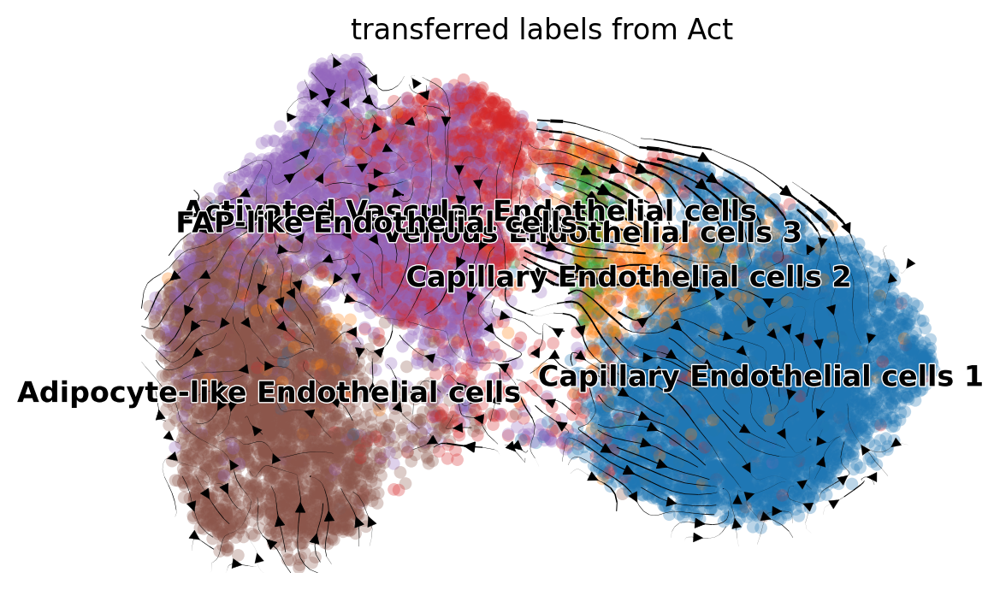

In [4]:
vk.plot_projection(basis="umap", recompute=True, color = 'transferred_labels_from_Act')

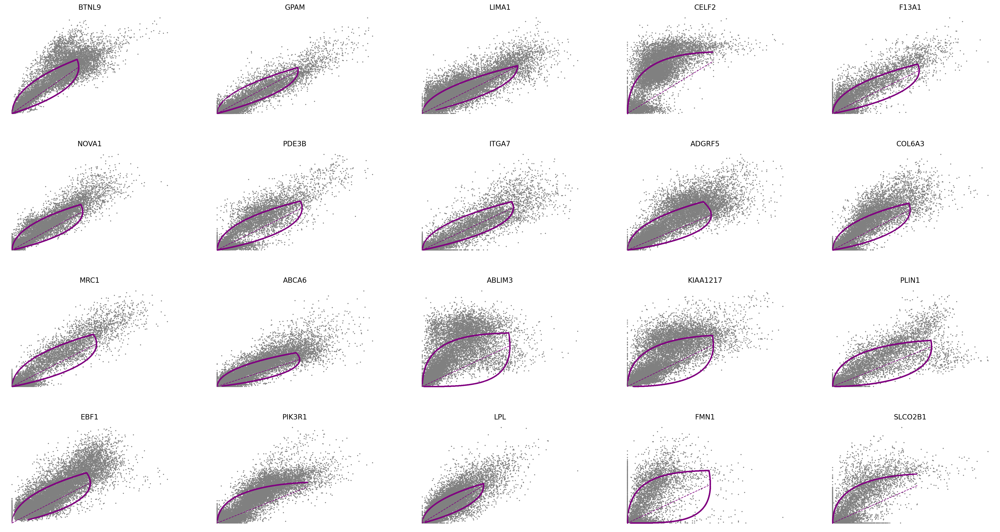

In [5]:
top_genes = adata.var["fit_likelihood"].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:20], ncols=5, frameon=False)

# Use pseudotime to recover directed differentiation

## Choosing the right pseudotime

In [6]:
sc.tl.diffmap(adata)

In [7]:
adata.obsm['X_diffmap'][:, 3].argmax()

14115

In [8]:
root_ixs = 14115  # has been found using 

/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


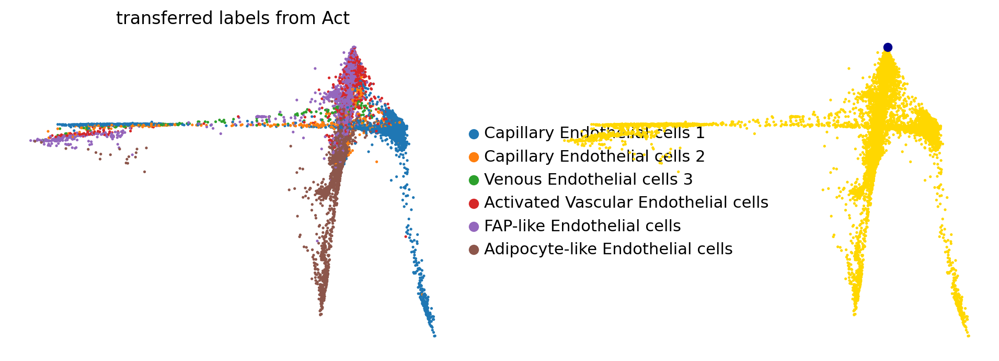

In [9]:
scv.pl.scatter(
    adata,
    basis="diffmap",
    c=["transferred_labels_from_Act", root_ixs],
    legend_loc="right",
    components=["2, 3"],
)

adata.uns["iroot"] = root_ixs

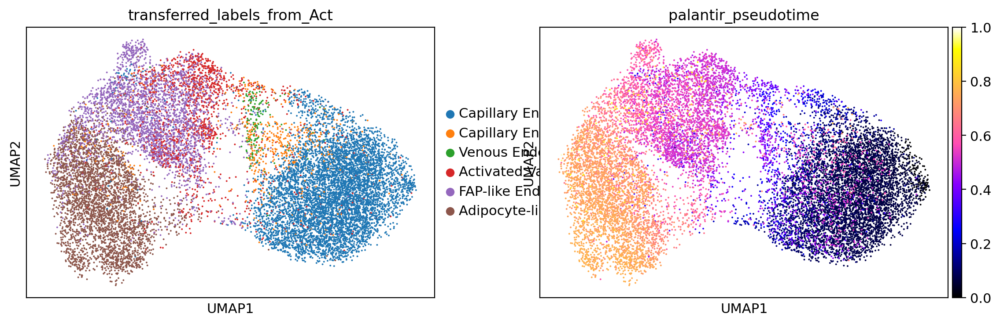

In [10]:
sc.tl.dpt(adata)
sc.pl.embedding(
    adata,
    basis="umap",
    color=["transferred_labels_from_Act", "palantir_pseudotime"],
    color_map="gnuplot2",
)

In [ ]:
adata

# Compute a transition matrix

Let’s use the Palantir pseudotime to compute a directed cell-cell transition matrix using the PseudotimeKernel:

In [11]:
pk = cr.kernels.PseudotimeKernel(adata, time_key="palantir_pseudotime")
pk.compute_transition_matrix()

print(pk)

Computing transition matrix based on pseudotime


  0%|          | 0/15000 [00:00<?, ?cell/s]

    Finish (0:00:09)
PseudotimeKernel[n=15000]


Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:01)


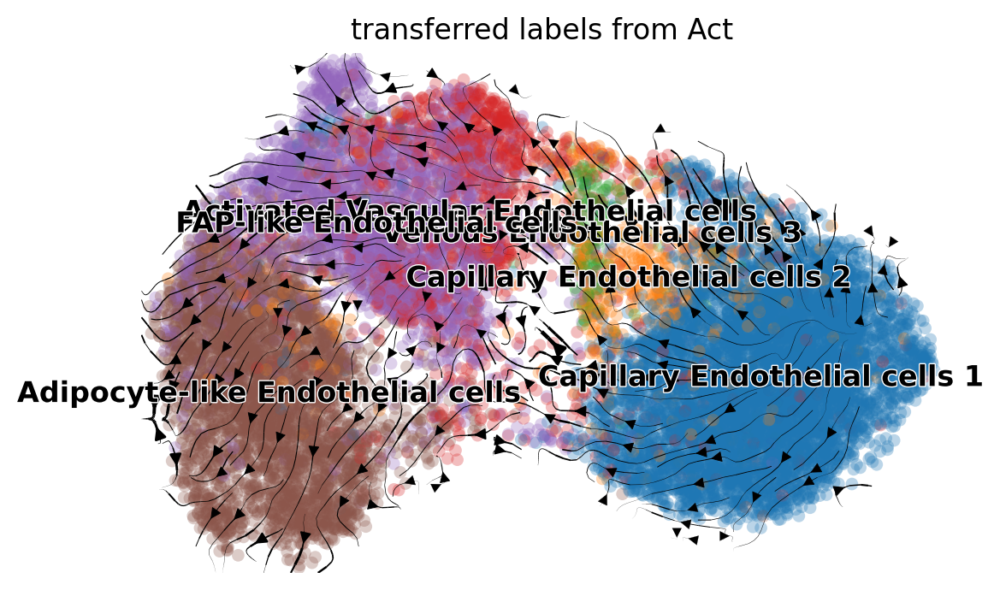

In [12]:
pk.plot_projection(basis="umap", recompute=True, color = 'transferred_labels_from_Act')

In [ ]:
# adata.write_h5ad('/home/mhassan/R_Projects/scAtlas/Revision/CellRank/CellRank_with_palantir/adata_scvelo_palantir_pseudotime_cellrank_b4_cytotrace_kernel.h5ad')

# CellRank Meets CytoTRACE

In [13]:
# filter, normalize total counts and log-transform
sc.pp.filter_genes(adata, min_cells=10)
scv.pp.normalize_per_cell(adata, enforce=True)
sc.pp.log1p(adata)

# hvg annotation
sc.pp.highly_variable_genes(adata)
print(f"This detected {adata.var['highly_variable'].sum()} highly variable genes. ")

Normalized count data: X, spliced, unspliced.
This detected 529 highly variable genes. 


In [14]:
adata.layers["spliced"] = adata.X
adata.layers["unspliced"] = adata.X
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


# Use developmental potential to direct differentiation

# Compute the CytoTRACE score

In [15]:
from cellrank.kernels import CytoTRACEKernel

ctk = CytoTRACEKernel(adata).compute_cytotrace()

Computing CytoTRACE score with `2000` genes. Consider using more than `10000` genes
Adding `adata.obs['ct_score']`
       `adata.obs['ct_pseudotime']`
       `adata.obs['ct_num_exp_genes']`
       `adata.var['ct_gene_corr']`
       `adata.var['ct_correlates']`
       `adata.uns['ct_params']`
    Finish (0:00:00)


In [ ]:
adata

# Compute & visualize a transition matrix

In [16]:
ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.5)

Computing transition matrix based on pseudotime


  0%|          | 0/15000 [00:00<?, ?cell/s]

/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=556685) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    Finish (0:00:02)


CytoTRACEKernel[n=15000, dnorm=False, scheme='soft', b=10.0, nu=0.5]

Using precomputed projection `adata.obsm['T_fwd_umap']`


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and 

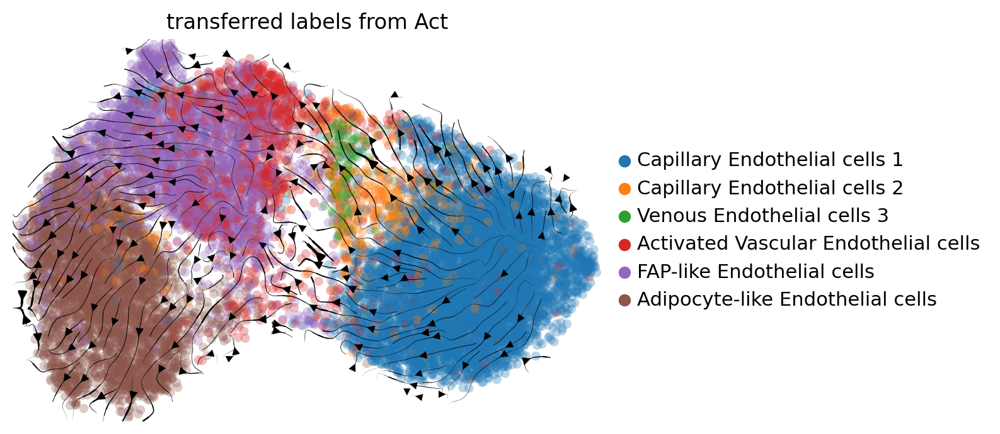

In [17]:
ctk.plot_projection(basis="umap", color="transferred_labels_from_Act", legend_loc="right")

Using precomputed projection `adata.obsm['T_fwd_umap']`


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:60: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return cat(data)  # if data is categorical/array
/home/

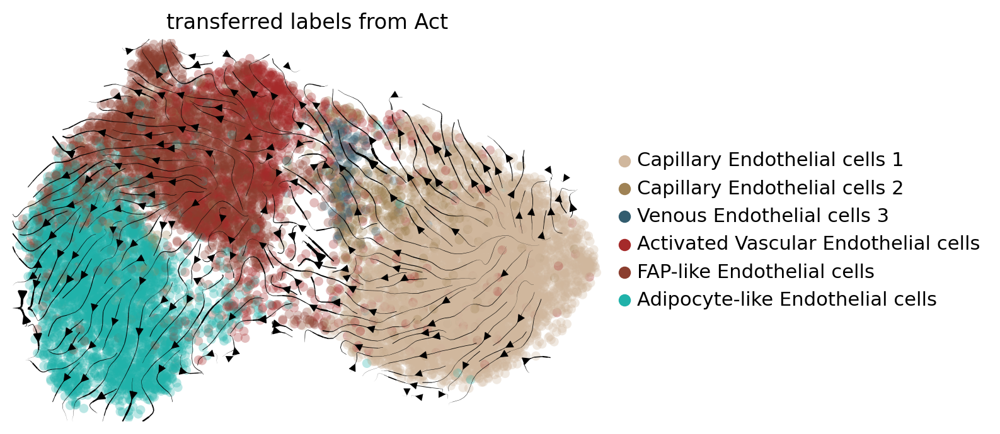

<Figure size 600x400 with 0 Axes>

In [18]:
mapped_colors = {
    "Capillary Endothelial cells 1": "#D0B79D",
    "Capillary Endothelial cells 2": "#9F8255",
    "Venous Endothelial cells 3": "#335D6F",
    "Activated Vascular Endothelial cells": "#a52a2a",
    "FAP-like Endothelial cells": "#8b3e2f",
    "Adipocyte-like Endothelial cells": "#20b2aa"
}

import matplotlib.pyplot as plt
ctk.plot_projection(basis="umap", color="transferred_labels_from_Act", legend_loc="right", palette = mapped_colors)
plt.draw()
plt.savefig('/home/mhassan/endoCellAtlas/CellRank2clone/test1.pdf')

Using precomputed projection `adata.obsm['T_fwd_umap']`


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:60: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return cat(data)  # if data is categorical/array
/home/

figure cannot be saved as pdf, using png instead (can only output finite numbers in pdf).
saving figure to file /home/mhassan/endoCellAtlas/CellRank2clone/Projection_test_recovered.png


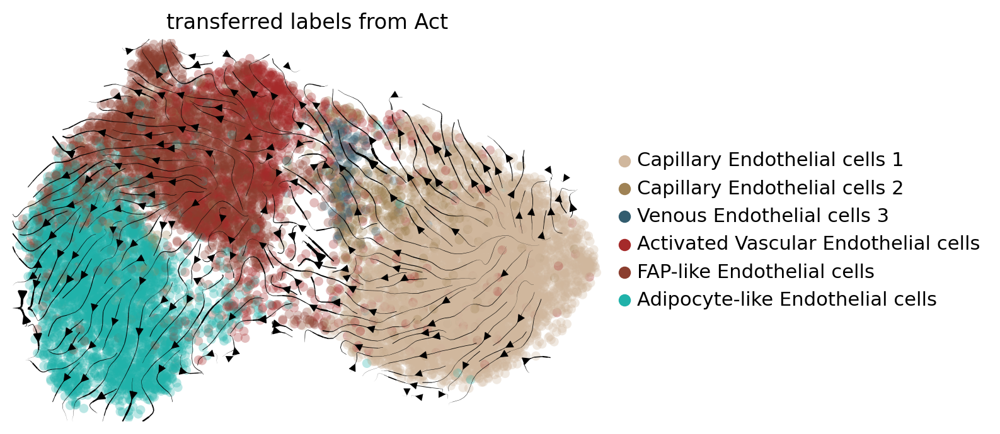

In [19]:
ctk.plot_projection(
    basis="umap",
    color="transferred_labels_from_Act",
    legend_loc="right",
    palette=mapped_colors,
    save='/home/mhassan/endoCellAtlas/CellRank2clone/Projection.pdf'
)


# Computing Initial and Terminal States

In [22]:
vk = cr.kernels.VelocityKernel.from_adata(adata, key="T_fwd")
vk

VelocityKernel[n=15000, model='deterministic', similarity='correlation', softmax_scale=7.07]

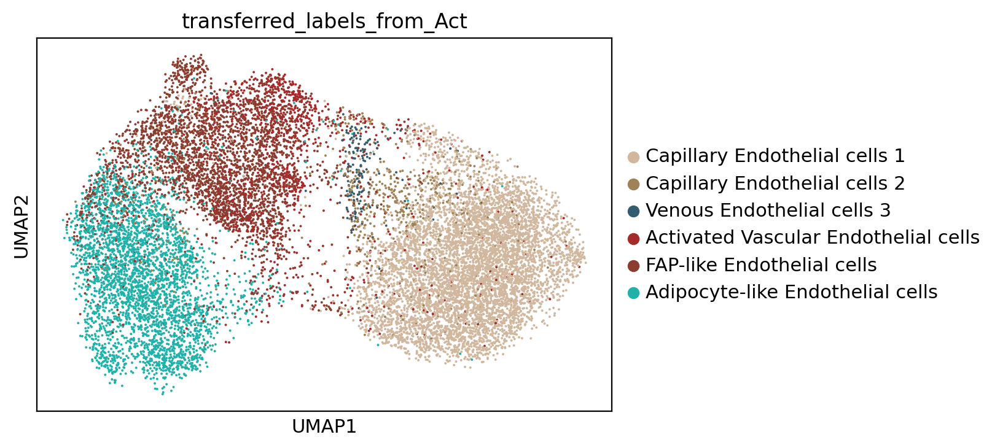

In [23]:
sc.pl.embedding(adata, basis="umap", color="transferred_labels_from_Act")

# Identify initial and terminal states

Initialize an estimator
The estimators allow you to analyze cell-state dynamics in CellRank. We initialize the GPCCA estimator here by passing the VelocityKernel [Reuter et al., 2019, Reuter et al., 2018]. However, the GPCCA estimator works with every CellRank kernel.

In [24]:
g = cr.estimators.GPCCA(vk)
print(g)

GPCCA[kernel=VelocityKernel[n=15000], initial_states=None, terminal_states=None]


Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:10:54)
Computing `12` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:45)


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and 

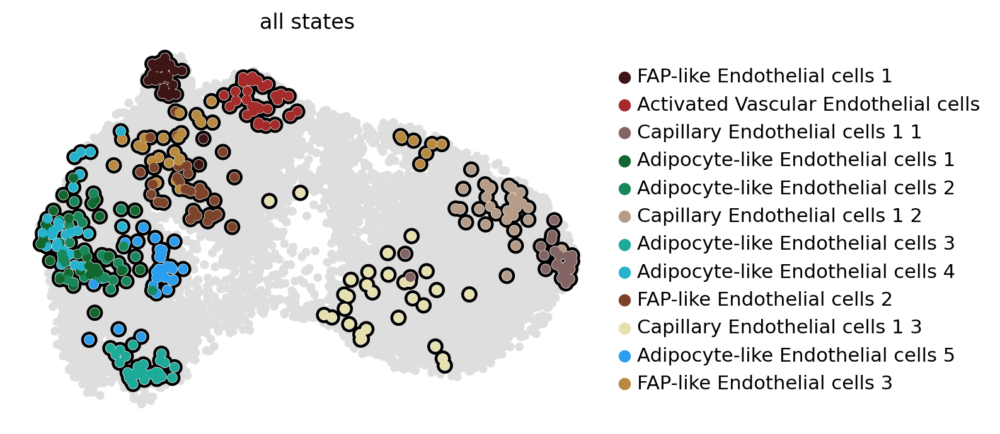

In [25]:
g.fit(n_states=12, cluster_key="transferred_labels_from_Act")
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and 

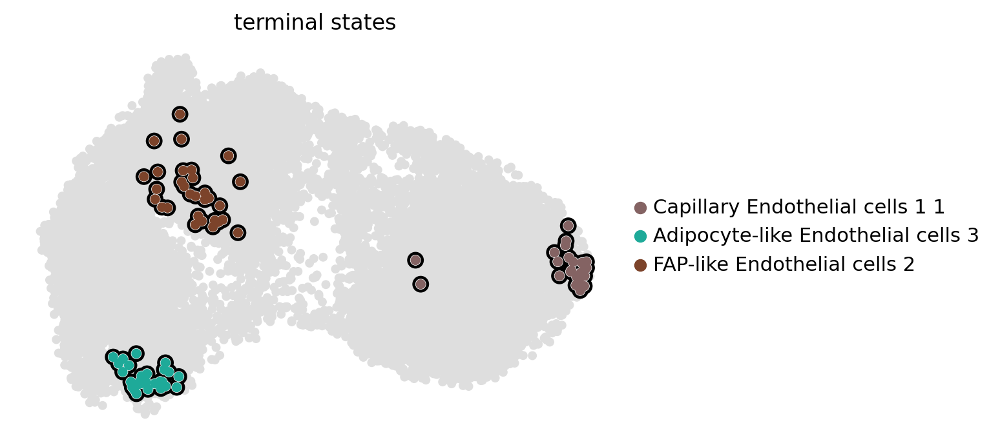

In [26]:
g.predict_terminal_states()
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

In [27]:
mapped_colors = {
    "Capillary Endothelial cells 1": "#D0B79D",
    "Capillary Endothelial cells 2": "#9F8255",
    "Venous Endothelial cells 3": "#335D6F",
    "Activated Vascular Endothelial cells": "#a52a2a",
    "FAP-like Endothelial cells": "#8b3e2f",
    "Adipocyte-like Endothelial cells": "#20b2aa"
}

/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and 

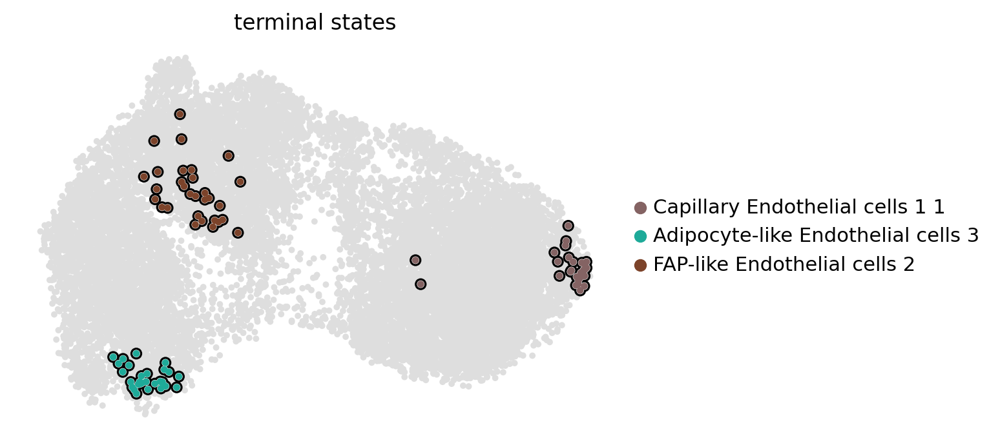

In [28]:
g.plot_macrostates(which="terminal", legend_loc="right", s=50)

/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and 

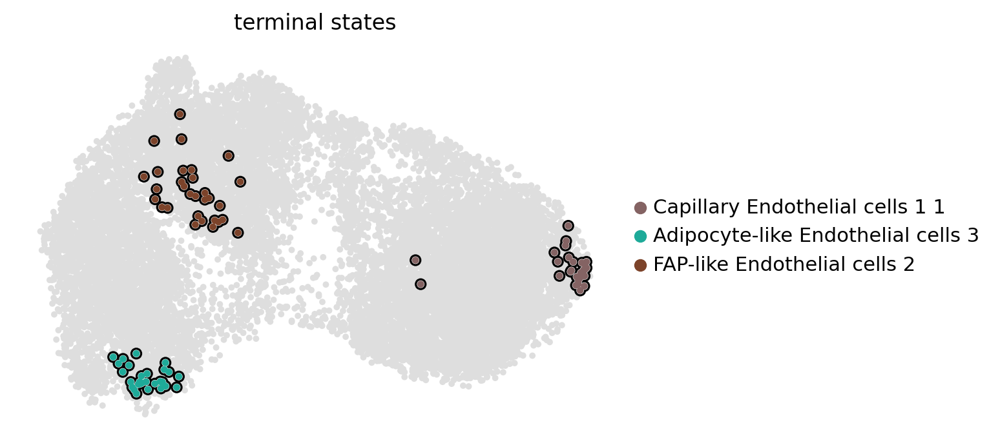

In [29]:
import matplotlib.pyplot as plt

# Create a figure and axis
fig, ax = plt.subplots()

# Pass the axis to the plotting function, if it supports this
g.plot_macrostates(which="terminal", legend_loc="right", s=50, ax=ax)

# Save the plot as a high-quality PDF
fig.savefig("/home/mhassan/endoCellAtlas/CellRank2clone/All_macrostates_recov_plot_wlegend.pdf", format="pdf", dpi=300, bbox_inches='tight')

# Show the plot (optional)
plt.show()


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and 

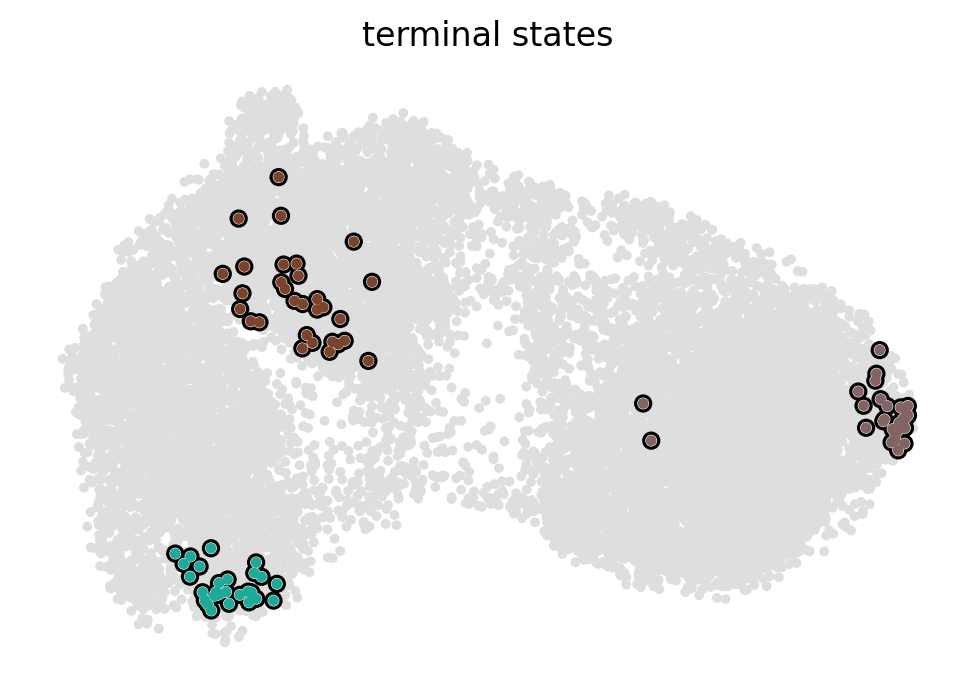

In [30]:
import matplotlib.pyplot as plt

# Create a figure and axis
fig, ax = plt.subplots()

# Pass the axis to the plotting function, if it supports this
g.plot_macrostates(which="terminal", legend_loc="none", s=50, ax=ax)

# Save the plot as a high-quality PDF
fig.savefig("/home/mhassan/endoCellAtlas/CellRank2clone/All_macrostates_recov_plot_nolegend.pdf", format="pdf", dpi=300, bbox_inches='tight')

# Show the plot (optional)
plt.show()


Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and 

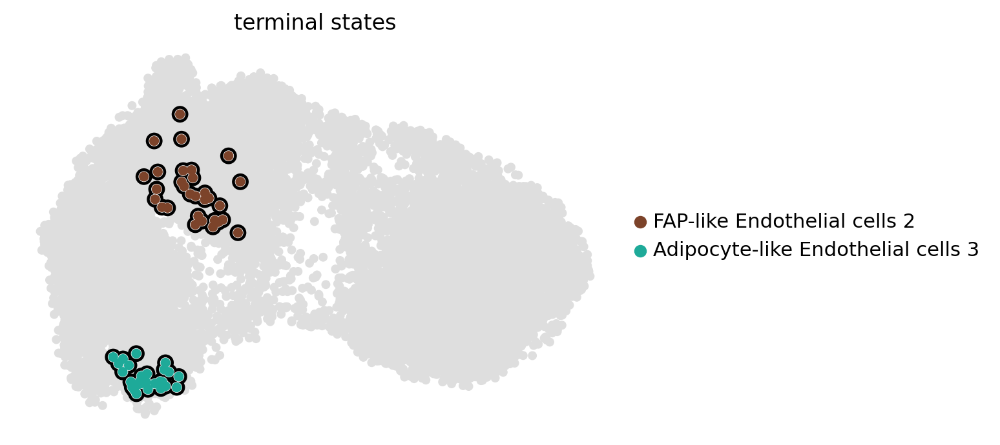

In [31]:
g.set_terminal_states(states=["FAP-like Endothelial cells_2", "Adipocyte-like Endothelial cells_3"])
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

Adding `adata.obs['init_states_fwd']`
       `adata.obs['init_states_fwd_probs']`
       `.initial_states`
       `.initial_states_probabilities`
       `.initial_states_memberships
    Finish`


/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/mhassan/snrnaProject1/miniconda3/envs/cellrank_cloned/lib/python3.12/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and 

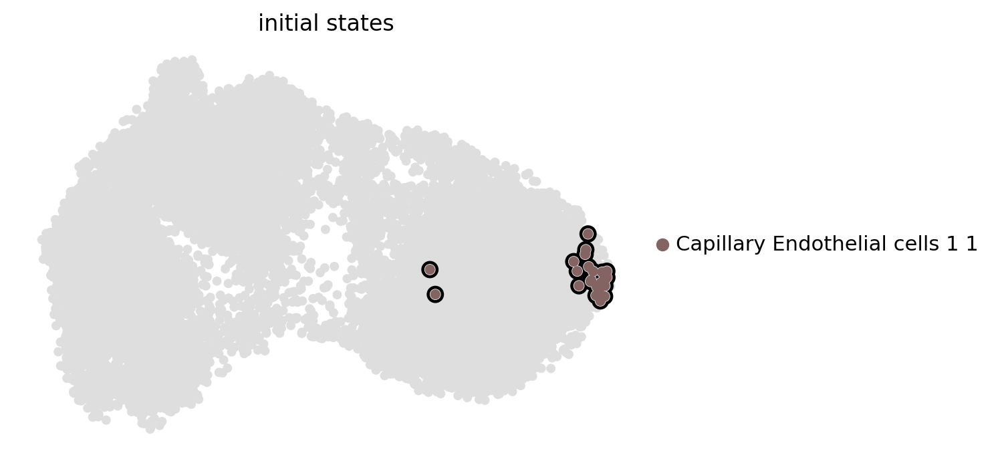

In [32]:
g.predict_initial_states()
g.plot_macrostates(which="initial", legend_loc="right", s=100)

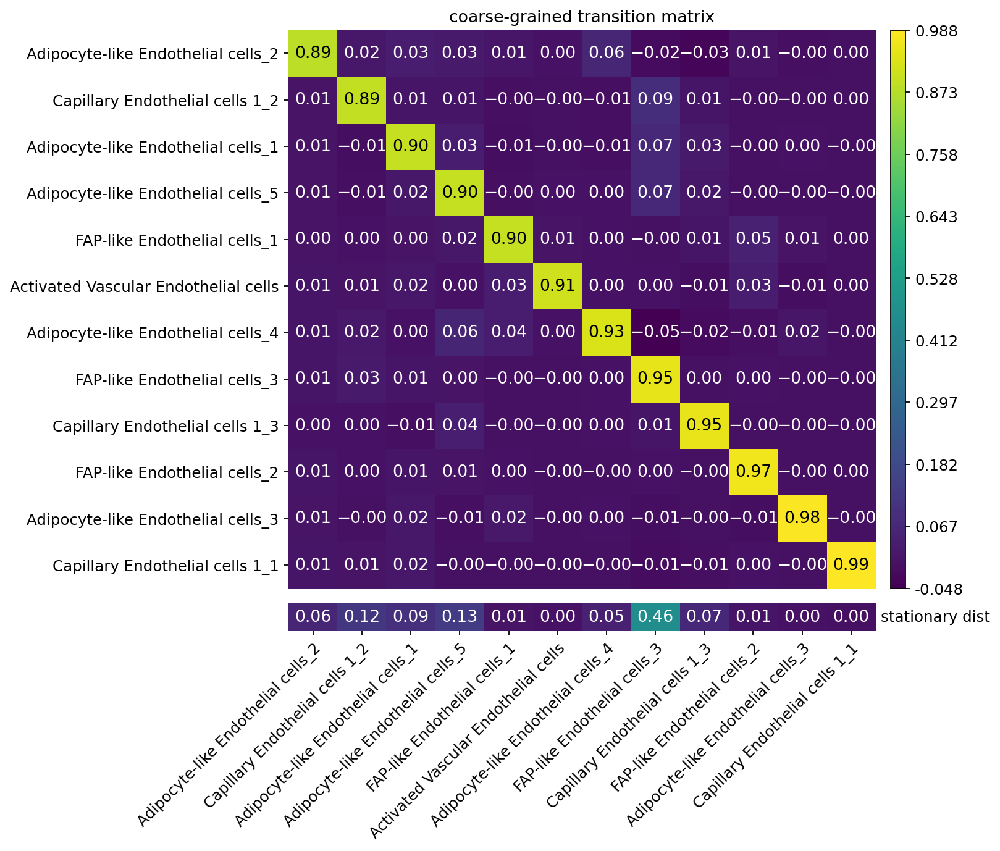

In [33]:
g.plot_coarse_T()

In [ ]:
cr.logging.print_versions()